In [1]:
# ======================================================
# Cell 1. 환경설정: 라이브러리 설치 (한 번만 실행)
# ======================================================
# PyG 설치는 PyTorch 버전에 맞춰 자동으로 설치를 시도합니다.
# 설치에 시간이 걸릴 수 있으니 한 번만 실행하세요.
!pip install -q transformers datasets scikit-learn tqdm sentence-transformers
# Install torch geometric - use the recommended wheels for current torch
import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.version.cuda
print("PyTorch", torch.__version__, "CUDA", CUDA_VERSION)
# Install PyG matching local torch+cuda if pip wheel available
if CUDA_VERSION is not None:
    # attempt to install latest matching wheels (this may vary by Colab runtime)
    !pip install -q torch-scatter -f https://data.pyg.org/whl/torch-$(python -c "import torch;print('.'.join(torch.__version__.split('.')[:2]))")+{CUDA_VERSION}.html || true
    !pip install -q torch-sparse -f https://data.pyg.org/whl/torch-$(python -c "import torch;print('.'.join(torch.__version__.split('.')[:2]))")+{CUDA_VERSION}.html || true
    !pip install -q torch-cluster -f https://data.pyg.org/whl/torch-$(python -c "import torch;print('.'.join(torch.__version__.split('.')[:2]))")+{CUDA_VERSION}.html || true
    !pip install -q torch-spline-conv -f https://data.pyg.org/whl/torch-$(python -c "import torch;print('.'.join(torch.__version__.split('.')[:2]))")+{CUDA_VERSION}.html || true
!pip install -q torch-geometric
# If above fails, fallback to generic install (may still work)
!pip install -q pyg_lib torch_cluster torch_scatter torch_sparse torch_spline_conv torch_geometric || true

# basic imports check
import sys, os
import numpy as np, pandas as pd
import torch
print("device:", torch.device("cuda" if torch.cuda.is_available() else "cpu"))

PyTorch 2.8.0+cu126 CUDA 12.6
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.0/210.0 kB 15.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 70.3 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement pyg_lib (from versions: none)
ERROR: No matching distribution found for pyg_lib
device: cuda


In [3]:
contextual = pd.read_csv('/content/drive/MyDrive/졸업논문/data/0923preprocessed/contextual_predicate.csv')
contextual

,String,Type,label,predicate
0,19 people buy this product per day,Social Proof,1,Activity Notifications
1,Flash Sale ends in SHOP NOW,Urgency,1,Limited-time Messages
2,17 people have viewed this wine today,Social Proof,1,Activity Notifications
3,These cookies are usually set by our marketing...,Not Dark Pattern,0,NaN
4,Strip Softbox,Not Dark Pattern,0,NaN
...,...,...,...,...
3195,This link will open in a new window,Not Dark Pattern,0,NaN
3196,B-Series Truck remotes,Not Dark Pattern,0,NaN
3197,"from Korea, Taiwan",Not Dark Pattern,0,NaN
3198,The best!,Not Dark Pattern,0,NaN


In [8]:
# ======================================================
# Cell 2. 설정 변수 (사용자 환경에 맞게 수정)
# ======================================================
# 모델/데이터 저장 경로 (Colab Drive 사용시 mount 필요)
# 예: "/content/drive/MyDrive/졸업논문/models/paraphrase_model"
USE_DRIVE = True

# if you want to save to Drive, mount and update SAVE_DIR
SAVE_DIR = "/content/drive/MyDrive/졸업논문/Test_Result/GNN"
os.makedirs(SAVE_DIR, exist_ok=True)

# Choose HF model for embeddings (can use 'sentence-transformers/all-MiniLM-L6-v2' or 'bert-base-uncased')
EMBED_MODEL = "sentence-transformers/all-MiniLM-L6-v2"  # faster for embeddings
CLASSIFIER_MODEL = "bert-base-uncased"  # if you later want to fine-tune a classifier

# GNN params
K_NEIGHBORS = 8        # k for kNN graph (adjust)
HIDDEN_DIM = 128
GNN_LAYERS = 2
EPOCHS = 10
LR = 1e-3
BATCH_SIZE = 32  # used only for embedding batching

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Config:", EMBED_MODEL, "-> device:", DEVICE)

Config: sentence-transformers/all-MiniLM-L6-v2 -> device: cuda



--- 'contextual' 데이터셋 처리 시작 ---
[contextual] 데이터셋에 대한 GNN 모델링 시작

[단계 1/7] 라벨 인코딩 중...
총 10개의 클래스를 발견했습니다: ['Activity Notifications' 'Confirmshaming' 'Countdown Timers'
 'High-demand Messages' 'Limited-time Messages' 'Low-stock Messages'
 'Not Dark Pattern' 'Pressured Selling' 'Testimonials of Uncertain Origin'
 'Trick Questions']

[단계 2/7] 'sentence-transformers/all-MiniLM-L6-v2' 모델로 문장 임베딩 생성 중...


contextual 임베딩:   0%|          | 0/100 [00:00<?, ?it/s]

임베딩 생성 완료 (형태: (3200, 384)), ./results/embeddings_contextual.npy에 저장됨

[단계 3/7] kNN 그래프 생성 중...
엣지 인덱스 생성 완료 (형태: (2, 64000))

[단계 4/7] 데이터 객체 생성 및 분할 중...
데이터 분할 완료: Train=2240, Validation=320, Test=640

[단계 5/7] GNN 모델 학습 중...
Epoch 010, Loss: 0.5560
Epoch 020, Loss: 0.3417
Epoch 030, Loss: 0.2608
Epoch 040, Loss: 0.2144
Epoch 050, Loss: 0.1841
Epoch 060, Loss: 0.1694
Epoch 070, Loss: 0.1374
Epoch 080, Loss: 0.1294
Epoch 090, Loss: 0.1037
Epoch 100, Loss: 0.1084
학습 완료, 모델이 ./results/gnn_model_contextual.pt에 저장됨

[단계 6/7] 예측 및 성능 평가 리포트 생성 중...
예측 결과가 ./results/gnn_predictions_contextual.csv에 저장됨

--- 최종 성능 평가 리포트 ---
                                  precision    recall  f1-score   support

          Activity Notifications       0.99      0.99      0.99       393
                  Confirmshaming       0.97      0.99      0.98       279
                Countdown Timers       0.98      0.97      0.97       213
            High-demand Messages       0.97      0.90      0.94        40
  

/tmp/ipython-input-2383533437.py:182: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', num_classes)


GNN 그래프가 ./results/gnn_graph_contextual.png에 저장됨

[contextual] 데이터셋에 대한 GNN 모델링 완료

--- 'paraphrase' 데이터셋 처리 시작 ---
[paraphrase] 데이터셋에 대한 GNN 모델링 시작

[단계 1/7] 라벨 인코딩 중...
총 10개의 클래스를 발견했습니다: ['Activity Notifications' 'Confirmshaming' 'Countdown Timers'
 'High-demand Messages' 'Limited-time Messages' 'Low-stock Messages'
 'Not Dark Pattern' 'Pressured Selling' 'Testimonials of Uncertain Origin'
 'Trick Questions']

[단계 2/7] 'sentence-transformers/all-MiniLM-L6-v2' 모델로 문장 임베딩 생성 중...


paraphrase 임베딩:   0%|          | 0/100 [00:00<?, ?it/s]

임베딩 생성 완료 (형태: (3200, 384)), ./results/embeddings_paraphrase.npy에 저장됨

[단계 3/7] kNN 그래프 생성 중...
엣지 인덱스 생성 완료 (형태: (2, 64000))

[단계 4/7] 데이터 객체 생성 및 분할 중...
데이터 분할 완료: Train=2240, Validation=320, Test=640

[단계 5/7] GNN 모델 학습 중...
Epoch 010, Loss: 0.4858
Epoch 020, Loss: 0.3083
Epoch 030, Loss: 0.2445
Epoch 040, Loss: 0.1967
Epoch 050, Loss: 0.1734
Epoch 060, Loss: 0.1445
Epoch 070, Loss: 0.1158
Epoch 080, Loss: 0.1088
Epoch 090, Loss: 0.1059
Epoch 100, Loss: 0.0780
학습 완료, 모델이 ./results/gnn_model_paraphrase.pt에 저장됨

[단계 6/7] 예측 및 성능 평가 리포트 생성 중...
예측 결과가 ./results/gnn_predictions_paraphrase.csv에 저장됨

--- 최종 성능 평가 리포트 ---
                                  precision    recall  f1-score   support

          Activity Notifications       0.98      0.99      0.99       394
                  Confirmshaming       0.97      0.96      0.96       273
                Countdown Timers       0.97      0.98      0.97       238
            High-demand Messages       0.90      0.90      0.90        40
  

/tmp/ipython-input-2383533437.py:182: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', num_classes)


GNN 그래프가 ./results/gnn_graph_paraphrase.png에 저장됨

[paraphrase] 데이터셋에 대한 GNN 모델링 완료

--- 'template' 데이터셋 처리 시작 ---
[template] 데이터셋에 대한 GNN 모델링 시작

[단계 1/7] 라벨 인코딩 중...
총 10개의 클래스를 발견했습니다: ['Activity Notifications' 'Confirmshaming' 'Countdown Timers'
 'High-demand Messages' 'Limited-time Messages' 'Low-stock Messages'
 'Not Dark Pattern' 'Pressured Selling' 'Testimonials of Uncertain Origin'
 'Trick Questions']

[단계 2/7] 'sentence-transformers/all-MiniLM-L6-v2' 모델로 문장 임베딩 생성 중...


template 임베딩:   0%|          | 0/100 [00:00<?, ?it/s]

임베딩 생성 완료 (형태: (3200, 384)), ./results/embeddings_template.npy에 저장됨

[단계 3/7] kNN 그래프 생성 중...
엣지 인덱스 생성 완료 (형태: (2, 64000))

[단계 4/7] 데이터 객체 생성 및 분할 중...
데이터 분할 완료: Train=2240, Validation=320, Test=640

[단계 5/7] GNN 모델 학습 중...
Epoch 010, Loss: 0.6336
Epoch 020, Loss: 0.3820
Epoch 030, Loss: 0.3082
Epoch 040, Loss: 0.2606
Epoch 050, Loss: 0.2163
Epoch 060, Loss: 0.1972
Epoch 070, Loss: 0.1637
Epoch 080, Loss: 0.1434
Epoch 090, Loss: 0.1404
Epoch 100, Loss: 0.1274
학습 완료, 모델이 ./results/gnn_model_template.pt에 저장됨

[단계 6/7] 예측 및 성능 평가 리포트 생성 중...
예측 결과가 ./results/gnn_predictions_template.csv에 저장됨

--- 최종 성능 평가 리포트 ---
                                  precision    recall  f1-score   support

          Activity Notifications       0.98      0.99      0.98       361
                  Confirmshaming       0.96      0.96      0.96       137
                Countdown Timers       0.93      0.91      0.92       160
            High-demand Messages       0.80      0.90      0.85        40
        

/tmp/ipython-input-2383533437.py:182: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', num_classes)


GNN 그래프가 ./results/gnn_graph_template.png에 저장됨

[template] 데이터셋에 대한 GNN 모델링 완료

모든 데이터셋에 대한 작업이 완료되었습니다.


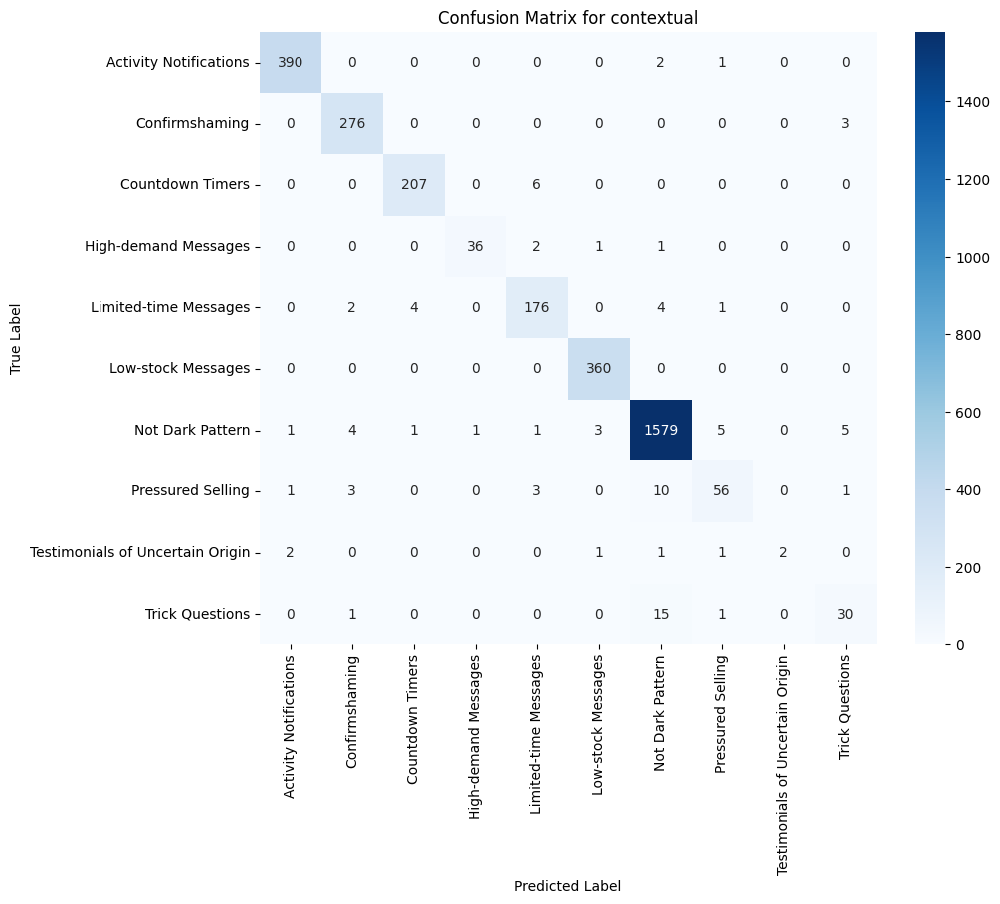

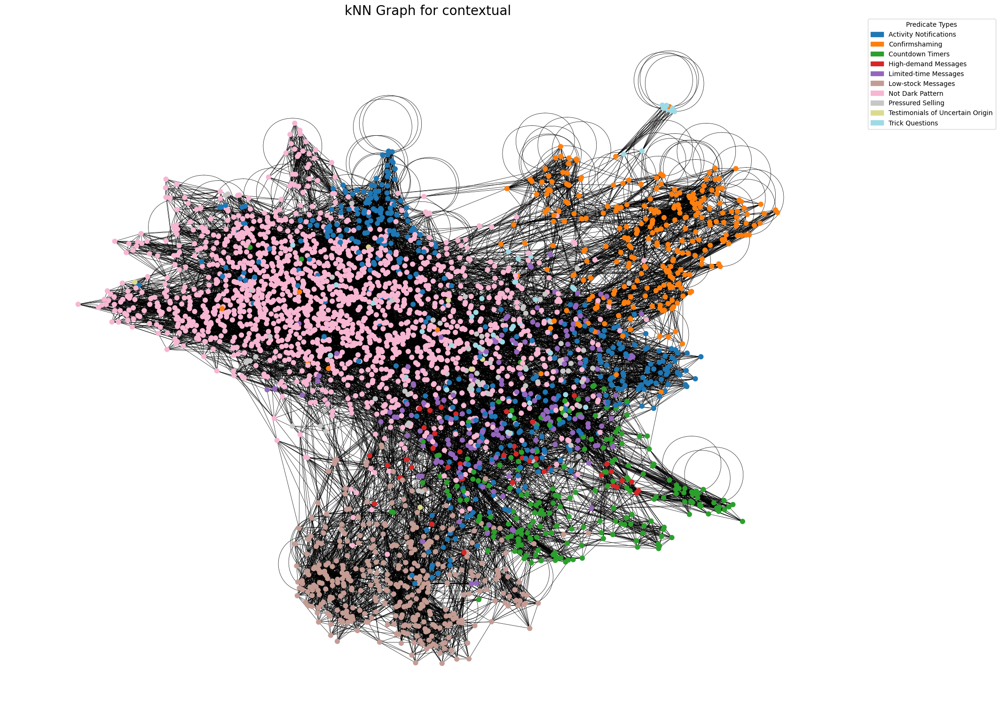

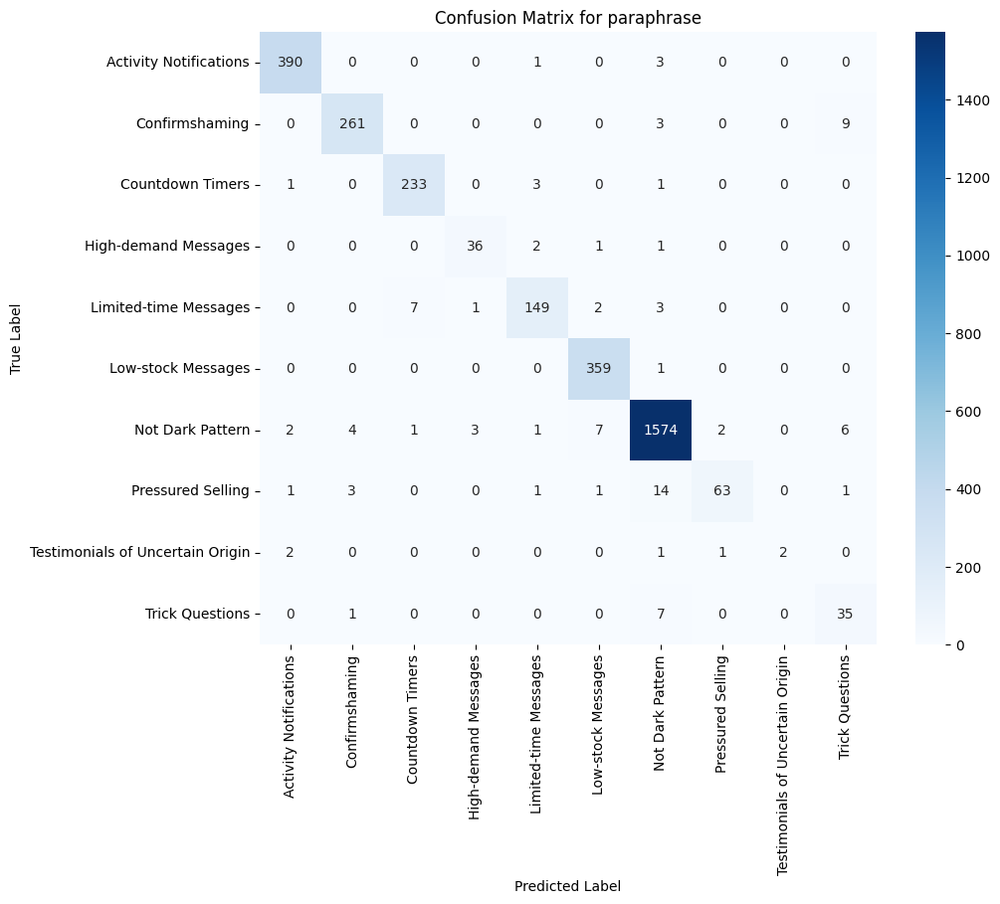

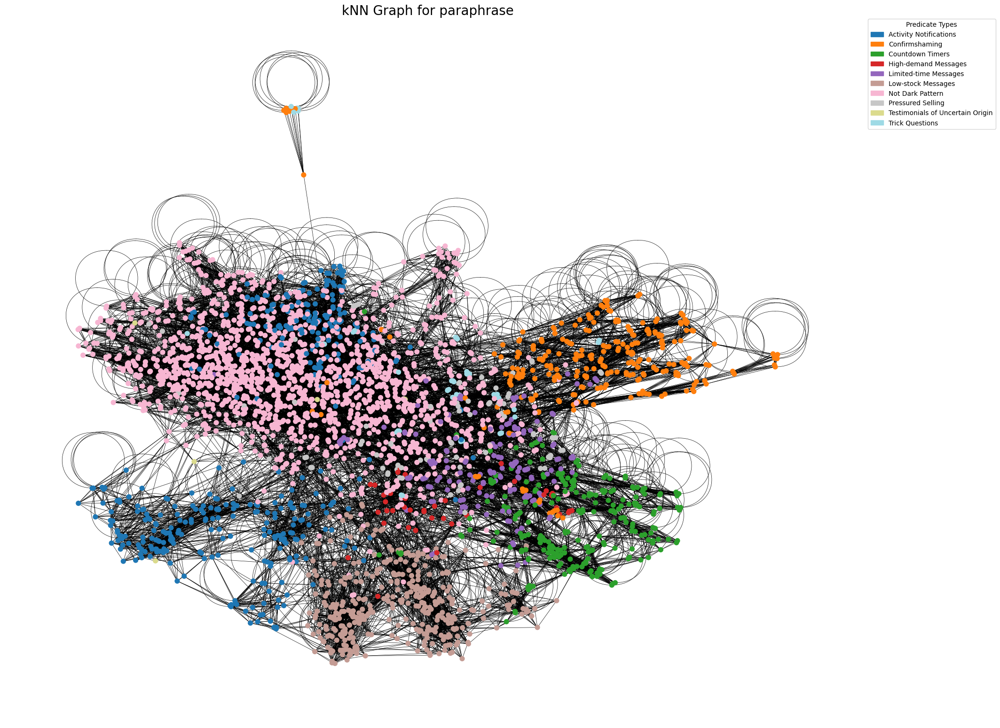

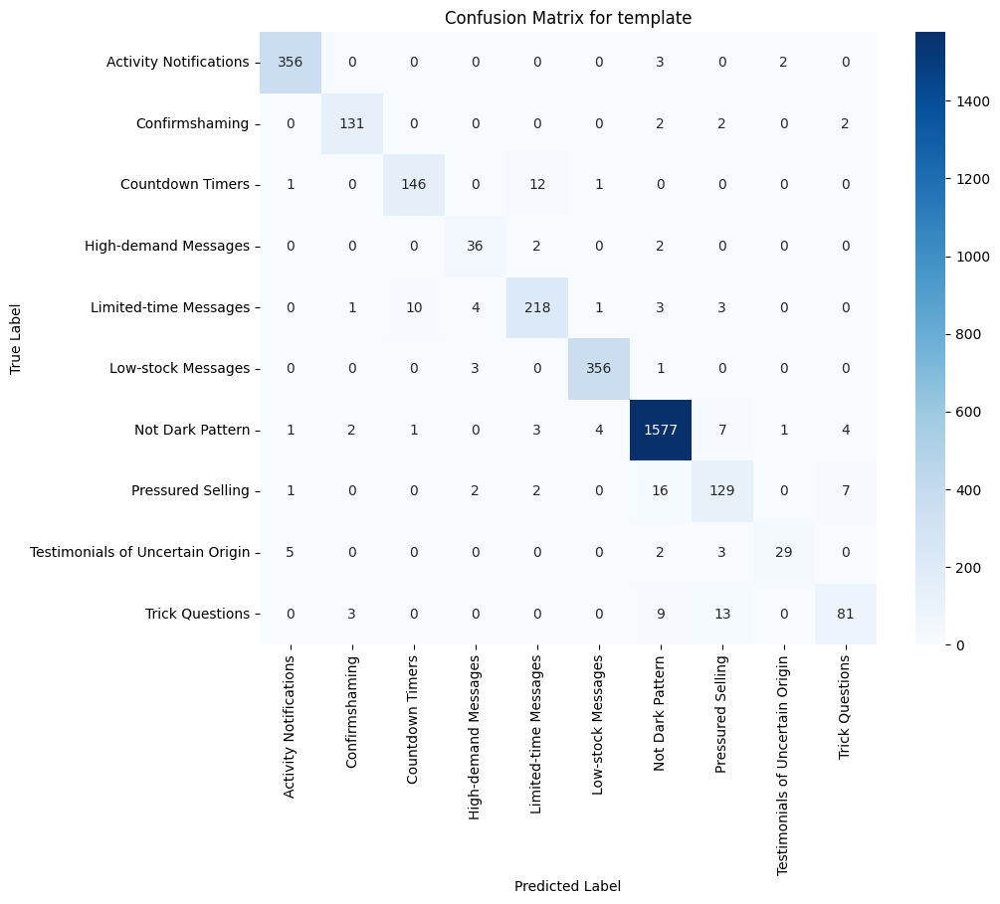

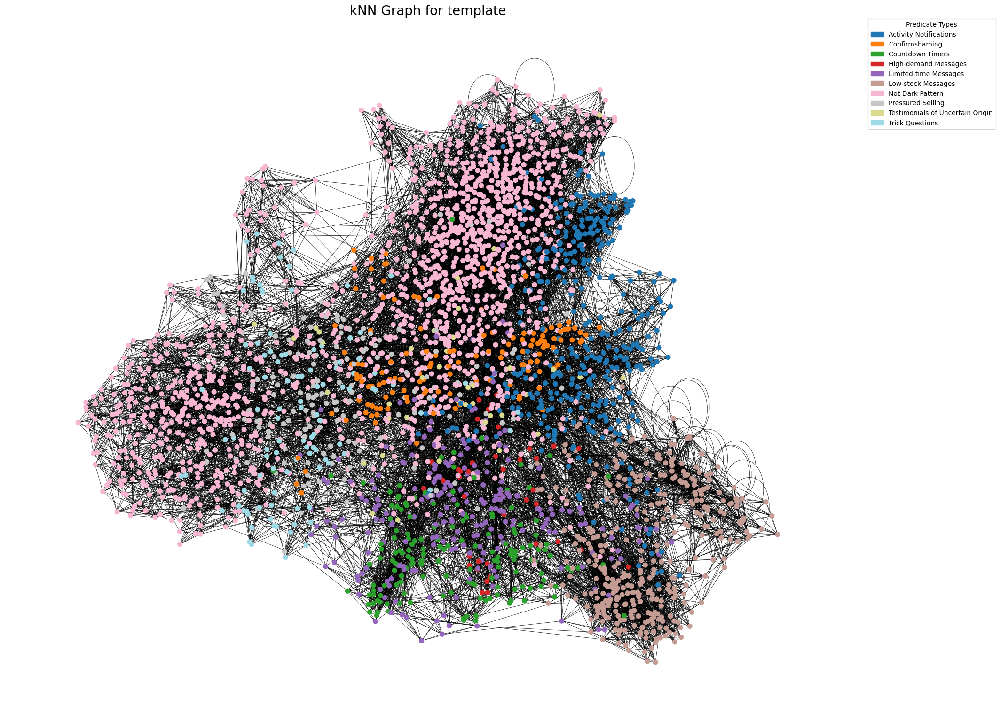

In [11]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from transformers import AutoTokenizer, AutoModel
from tqdm.notebook import tqdm
import numpy as np
from sklearn.neighbors import NearestNeighbors
import scipy.sparse as sp
from torch_geometric.data import Data
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import torch.optim as optim
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from torch_geometric.utils import to_networkx
import os # os 모듈 import 추가 (SAVE_DIR 사용 시 필요)
from matplotlib.patches import Patch # 그래프 범례를 위한 Patch import 추가

# 하이퍼파라미터 (함수 밖이나 위에 정의해두는 것이 좋습니다)
SAVE_DIR = './results'
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)

K_NEIGHBORS = 10
HIDDEN_DIM = 128
GNN_LAYERS = 2
LR = 0.01
EPOCHS = 100

def run_gnn_on_dataframe(df, dataset_name):
    print("="*70)
    print(f"[{dataset_name}] 데이터셋에 대한 GNN 모델링 시작")
    print("="*70)

    print("\n[단계 1/7] 라벨 인코딩 중...")
    sentence_col = 'String'
    label_col = 'predicate'
    df.dropna(subset=[sentence_col, label_col], inplace=True)
    sentences = df[sentence_col].astype(str).tolist()
    labels_raw = df[label_col].tolist()

    le = LabelEncoder()
    labels_enc = le.fit_transform(labels_raw)
    num_classes = len(np.unique(labels_enc))
    print(f"총 {num_classes}개의 클래스를 발견했습니다: {le.classes_}")

    # =====[수정 1]===== EMBED_MODEL 정의를 print 문 앞으로 이동
    EMBED_MODEL = "sentence-transformers/all-MiniLM-L6-v2"
    print(f"\n[단계 2/7] '{EMBED_MODEL}' 모델로 문장 임베딩 생성 중...")

    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    BATCH_SIZE = 32
    embed_tokenizer = AutoTokenizer.from_pretrained(EMBED_MODEL)
    embed_model = AutoModel.from_pretrained(EMBED_MODEL).to(DEVICE)
    embed_model.eval()

    def mean_pooling(model_output, attention_mask):
        token_embeddings = model_output[0]
        input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
        return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

    all_embeddings = []
    for i in tqdm(range(0, len(sentences), BATCH_SIZE), desc=f"{dataset_name} 임베딩"):
        batch_texts = sentences[i:i+BATCH_SIZE]
        inputs = embed_tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.no_grad():
            outputs = embed_model(**inputs)
            emb = mean_pooling(outputs, inputs['attention_mask']).cpu().numpy()
        all_embeddings.append(emb)
    all_embeddings = np.vstack(all_embeddings)
    emb_path = os.path.join(SAVE_DIR, f"embeddings_{dataset_name}.npy")
    np.save(emb_path, all_embeddings)
    print(f"임베딩 생성 완료 (형태: {all_embeddings.shape}), {emb_path}에 저장됨")

    print("\n[단계 3/7] kNN 그래프 생성 중...")
    n_neighbors = min(K_NEIGHBORS, len(all_embeddings)-1)
    nbrs = NearestNeighbors(n_neighbors=n_neighbors+1, metric="cosine").fit(all_embeddings)
    _, indices = nbrs.kneighbors(all_embeddings)
    edge_index_list = []
    for i in range(len(indices)):
        for j in indices[i][1:]:
            edge_index_list.append((i, j))
            edge_index_list.append((j, i))
    edge_index = np.array(edge_index_list).T
    print(f"엣지 인덱스 생성 완료 (형태: {edge_index.shape})")

    print("\n[단계 4/7] 데이터 객체 생성 및 분할 중...")
    data = Data(x=torch.tensor(all_embeddings, dtype=torch.float),
                edge_index=torch.tensor(edge_index, dtype=torch.long),
                y=torch.tensor(labels_enc, dtype=torch.long))

    num_nodes = data.num_nodes
    perm = np.random.permutation(num_nodes)

    n_train = int(0.7 * num_nodes)
    n_val = int(0.1 * num_nodes)

    train_idx = perm[:n_train]
    val_idx = perm[n_train : n_train + n_val]
    test_idx = perm[n_train + n_val:]

    data.train_mask = torch.zeros(num_nodes, dtype=torch.bool)
    data.val_mask = torch.zeros(num_nodes, dtype=torch.bool)
    data.test_mask = torch.zeros(num_nodes, dtype=torch.bool)
    data.train_mask[train_idx] = True
    data.val_mask[val_idx] = True
    data.test_mask[test_idx] = True

    print(f"데이터 분할 완료: Train={len(train_idx)}, Validation={len(val_idx)}, Test={len(test_idx)}")


    print("\n[단계 5/7] GNN 모델 학습 중...")
    class GCNClassifier(torch.nn.Module):
        def __init__(self, in_dim, hidden_dim, out_dim, n_layers=2, dropout=0.5):
            super().__init__()
            self.convs = torch.nn.ModuleList()
            self.convs.append(GCNConv(in_dim, hidden_dim))
            for _ in range(n_layers-1):
                self.convs.append(GCNConv(hidden_dim, hidden_dim))
            self.lin = torch.nn.Linear(hidden_dim, out_dim)
            self.dropout = dropout
        def forward(self, x, edge_index):
            for conv in self.convs:
                x = conv(x, edge_index)
                x = F.relu(x)
                x = F.dropout(x, p=self.dropout, training=self.training)
            return self.lin(x)

    model_gnn = GCNClassifier(in_dim=data.x.size(1), hidden_dim=HIDDEN_DIM, out_dim=num_classes, n_layers=GNN_LAYERS).to(DEVICE)
    optimizer = optim.Adam(model_gnn.parameters(), lr=LR, weight_decay=1e-5)
    criterion = torch.nn.CrossEntropyLoss()
    data = data.to(DEVICE)

    for epoch in range(1, EPOCHS + 1):
        model_gnn.train()
        optimizer.zero_grad()
        out = model_gnn(data.x, data.edge_index)
        loss = criterion(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()
        if epoch % 10 == 0 or epoch == EPOCHS: # 로그 출력 빈도 조절
            print(f"Epoch {epoch:03d}, Loss: {loss.item():.4f}")

    model_path = os.path.join(SAVE_DIR, f"gnn_model_{dataset_name}.pt")
    torch.save(model_gnn.state_dict(), model_path)
    print(f"학습 완료, 모델이 {model_path}에 저장됨")

    print("\n[단계 6/7] 예측 및 성능 평가 리포트 생성 중...")
    model_gnn.eval()
    with torch.no_grad():
        out = model_gnn(data.x, data.edge_index)
    preds = out.argmax(dim=1).cpu().numpy()
    df_res = pd.DataFrame({"sentence": sentences, "true_label": labels_raw, "pred_label_enc": preds})
    df_res["pred_label"] = le.inverse_transform(preds)

    pred_path = os.path.join(SAVE_DIR, f"gnn_predictions_{dataset_name}.csv")
    df_res.to_csv(pred_path, index=False, encoding="utf-8-sig")
    print(f"예측 결과가 {pred_path}에 저장됨")

    report = classification_report(labels_enc, preds, target_names=le.classes_, zero_division=0)
    print("\n--- 최종 성능 평가 리포트 ---")
    print(report)

    cm = confusion_matrix(labels_enc, preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix for {dataset_name}')
    cm_path = os.path.join(SAVE_DIR, f"confusion_matrix_{dataset_name}.png")
    plt.savefig(cm_path)
    # plt.show() # 루프 안에서 계속 창이 뜨는 것을 방지하려면 주석 처리 가능

    print(f"Confusion Matrix가 {cm_path}에 저장됨")

    print(f"\n[단계 7/7] {dataset_name} GNN 그래프 시각화 중 (범례 포함)...")
    # !pip install -q networkx # Colab 환경이 아니라면 매번 실행할 필요 없음
    G = to_networkx(data.cpu(), to_undirected=True)
    class_names = le.classes_
    cmap = plt.cm.get_cmap('tab20', num_classes)
    node_colors = [cmap(i) for i in data.y.cpu().numpy()]

    plt.figure(figsize=(18, 15))
    pos = nx.spring_layout(G, iterations=50, seed=42)
    nx.draw(G, pos, node_color=node_colors, with_labels=False, node_size=50, width=0.5)

    # =====[수정 3]===== Patch가 import 되었으므로 정상 작동
    legend_handles = [Patch(color=cmap(i), label=name) for i, name in enumerate(class_names)]

    plt.legend(handles=legend_handles,
               title="Predicate Types",
               bbox_to_anchor=(1.02, 1),
               loc='upper left',
               borderaxespad=0.)

    plt.title(f'kNN Graph for {dataset_name}', fontsize=20)
    graph_path = os.path.join(SAVE_DIR, f"gnn_graph_{dataset_name}.png")

    plt.savefig(graph_path, bbox_inches='tight')
    # plt.show()
    print(f"GNN 그래프가 {graph_path}에 저장됨")

    print(f"\n[{dataset_name}] 데이터셋에 대한 GNN 모델링 완료")

# 데이터 로딩 및 실행 부분
data_files = {
    "contextual": '/content/drive/MyDrive/졸업논문/data/0923preprocessed/contextual_predicate.csv',
    "paraphrase": '/content/drive/MyDrive/졸업논문/data/0923preprocessed/paraphrase_predicate.csv',
    "template": '/content/drive/MyDrive/졸업논문/data/0923preprocessed/template_predicate.csv'
}

for name, path in data_files.items():
    print(f"\n--- '{name}' 데이터셋 처리 시작 ---")
    try:
        df = pd.read_csv(path)
        if 'text' in df.columns and 'sentence' not in df.columns:
            df.rename(columns={'text': 'sentence'}, inplace=True)
        # =====[수정 2]===== fillna 방식 변경
        df['predicate'] = df['predicate'].fillna('Not Dark Pattern')
        run_gnn_on_dataframe(df, name)
    except FileNotFoundError:
        print(f"[오류] {path} 파일을 찾을 수 없습니다. 건너뜁니다.")
    except Exception as e:
        print(f"[오류] {name} 데이터셋 처리 중 오류 발생: {e}")

print("\n모든 데이터셋에 대한 작업이 완료되었습니다.")



============================== 'contextual' 데이터셋 처리 시작 ==============================
[contextual] 데이터셋에 대한 GNN 이진 분류 모델링 시작

[단계 1/7] 이진 라벨 생성 중...
총 2개의 클래스로 변환 완료: ['Not Dark Pattern', 'Dark Pattern']

[단계 2/7] 'sentence-transformers/all-MiniLM-L6-v2' 모델로 문장 임베딩 생성 중...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

contextual_binary 임베딩:   0%|          | 0/94 [00:00<?, ?it/s]

임베딩 생성 완료 (형태: (3000, 384)), /content/drive/MyDrive/졸업논문/Test_Result/GNN/embeddings_contextual_binary.npy에 저장됨

[단계 3/7] kNN 그래프 생성 중...
엣지 인덱스 생성 완료 (형태: torch.Size([2, 27000]))

[단계 4/7] PyTorch Geometric 데이터 객체 생성 중...
데이터 객체 생성 완료: Data(x=[3000, 384], edge_index=[2, 27000], y=[3000], train_mask=[3000], val_mask=[3000])

[단계 5/7] GNN 모델 학습 중...
Epoch 02, Loss: 0.6490
Epoch 04, Loss: 0.5924
Epoch 06, Loss: 0.5451
Epoch 08, Loss: 0.5037
Epoch 10, Loss: 0.4663
학습 완료, 모델이 /content/drive/MyDrive/졸업논문/Test_Result/GNN/gnn_model_contextual_binary.pt에 저장됨

[단계 6/7] 예측 및 성능 평가 리포트 생성 중...

--- 최종 성능 평가 리포트 ---
                  precision    recall  f1-score   support

Not Dark Pattern       0.95      0.16      0.27      1000
    Dark Pattern       0.70      1.00      0.82      2000

        accuracy                           0.72      3000
       macro avg       0.83      0.58      0.55      3000
    weighted avg       0.78      0.72      0.64      3000



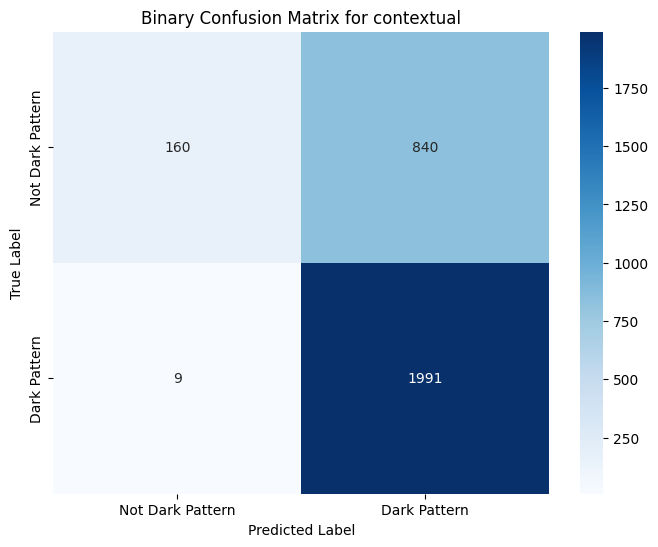

Confusion Matrix가 /content/drive/MyDrive/졸업논문/Test_Result/GNN/confusion_matrix_contextual_binary.png에 저장됨

[단계 7/7] contextual GNN 그래프 시각화 중 (이진 분류)...


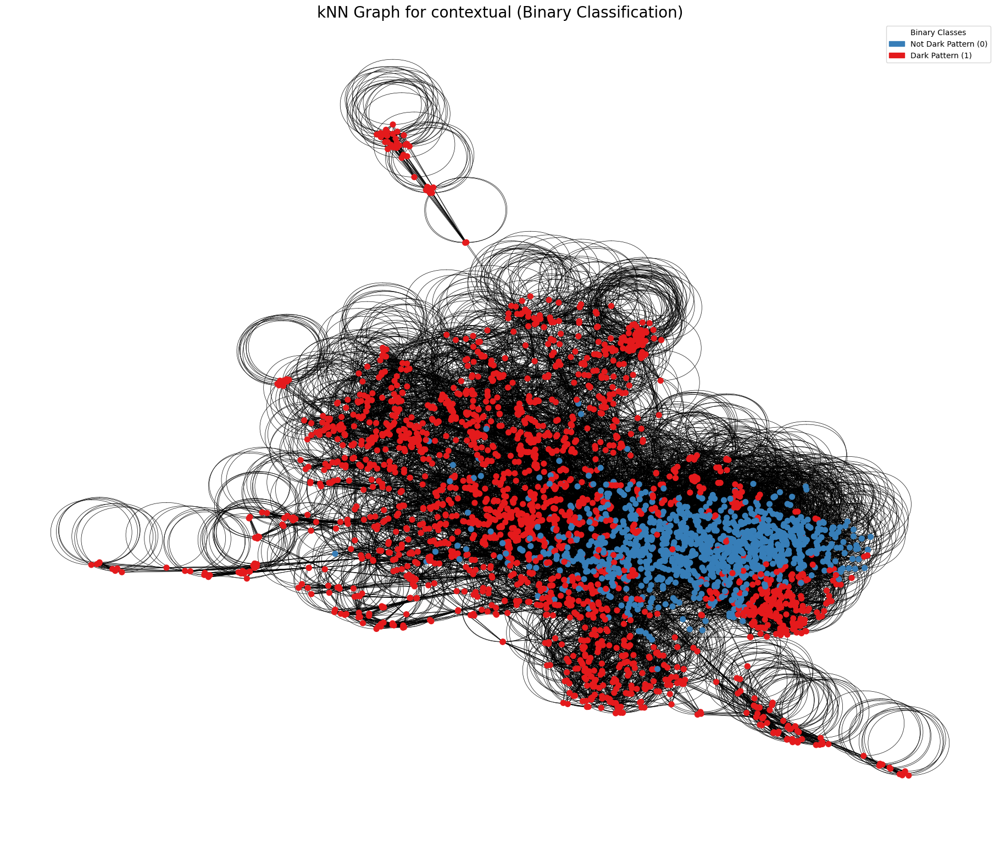

GNN 그래프가 /content/drive/MyDrive/졸업논문/Test_Result/GNN/gnn_graph_contextual_binary.png에 저장됨


============================== 'paraphrase' 데이터셋 처리 시작 ==============================
[paraphrase] 데이터셋에 대한 GNN 이진 분류 모델링 시작

[단계 1/7] 이진 라벨 생성 중...
총 2개의 클래스로 변환 완료: ['Not Dark Pattern', 'Dark Pattern']

[단계 2/7] 'sentence-transformers/all-MiniLM-L6-v2' 모델로 문장 임베딩 생성 중...


paraphrase_binary 임베딩:   0%|          | 0/94 [00:00<?, ?it/s]

임베딩 생성 완료 (형태: (3000, 384)), /content/drive/MyDrive/졸업논문/Test_Result/GNN/embeddings_paraphrase_binary.npy에 저장됨

[단계 3/7] kNN 그래프 생성 중...
엣지 인덱스 생성 완료 (형태: torch.Size([2, 27000]))

[단계 4/7] PyTorch Geometric 데이터 객체 생성 중...
데이터 객체 생성 완료: Data(x=[3000, 384], edge_index=[2, 27000], y=[3000], train_mask=[3000], val_mask=[3000])

[단계 5/7] GNN 모델 학습 중...
Epoch 02, Loss: 0.6404
Epoch 04, Loss: 0.5812
Epoch 06, Loss: 0.5410
Epoch 08, Loss: 0.4914
Epoch 10, Loss: 0.4474
학습 완료, 모델이 /content/drive/MyDrive/졸업논문/Test_Result/GNN/gnn_model_paraphrase_binary.pt에 저장됨

[단계 6/7] 예측 및 성능 평가 리포트 생성 중...

--- 최종 성능 평가 리포트 ---
                  precision    recall  f1-score   support

Not Dark Pattern       0.94      0.30      0.45      1000
    Dark Pattern       0.74      0.99      0.85      2000

        accuracy                           0.76      3000
       macro avg       0.84      0.65      0.65      3000
    weighted avg       0.81      0.76      0.72      3000



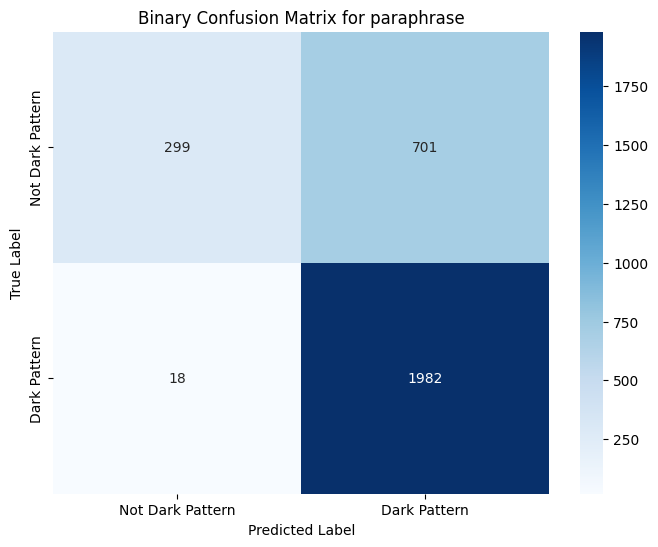

Confusion Matrix가 /content/drive/MyDrive/졸업논문/Test_Result/GNN/confusion_matrix_paraphrase_binary.png에 저장됨

[단계 7/7] paraphrase GNN 그래프 시각화 중 (이진 분류)...


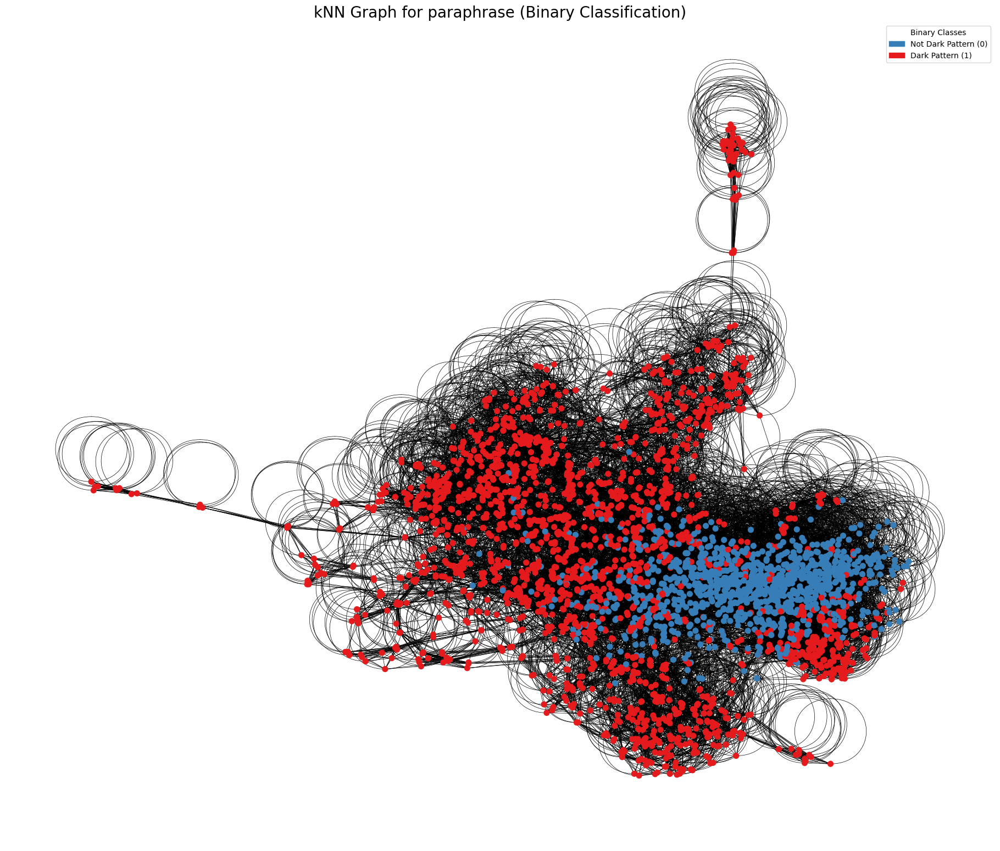

GNN 그래프가 /content/drive/MyDrive/졸업논문/Test_Result/GNN/gnn_graph_paraphrase_binary.png에 저장됨


============================== 'template' 데이터셋 처리 시작 ==============================
[template] 데이터셋에 대한 GNN 이진 분류 모델링 시작

[단계 1/7] 이진 라벨 생성 중...
총 2개의 클래스로 변환 완료: ['Not Dark Pattern', 'Dark Pattern']

[단계 2/7] 'sentence-transformers/all-MiniLM-L6-v2' 모델로 문장 임베딩 생성 중...


template_binary 임베딩:   0%|          | 0/94 [00:00<?, ?it/s]

임베딩 생성 완료 (형태: (3000, 384)), /content/drive/MyDrive/졸업논문/Test_Result/GNN/embeddings_template_binary.npy에 저장됨

[단계 3/7] kNN 그래프 생성 중...
엣지 인덱스 생성 완료 (형태: torch.Size([2, 27000]))

[단계 4/7] PyTorch Geometric 데이터 객체 생성 중...
데이터 객체 생성 완료: Data(x=[3000, 384], edge_index=[2, 27000], y=[3000], train_mask=[3000], val_mask=[3000])

[단계 5/7] GNN 모델 학습 중...
Epoch 02, Loss: 0.6136
Epoch 04, Loss: 0.5560
Epoch 06, Loss: 0.5058
Epoch 08, Loss: 0.4627
Epoch 10, Loss: 0.4211
학습 완료, 모델이 /content/drive/MyDrive/졸업논문/Test_Result/GNN/gnn_model_template_binary.pt에 저장됨

[단계 6/7] 예측 및 성능 평가 리포트 생성 중...

--- 최종 성능 평가 리포트 ---
                  precision    recall  f1-score   support

Not Dark Pattern       0.93      0.48      0.63      1000
    Dark Pattern       0.79      0.98      0.88      2000

        accuracy                           0.81      3000
       macro avg       0.86      0.73      0.75      3000
    weighted avg       0.84      0.81      0.79      3000



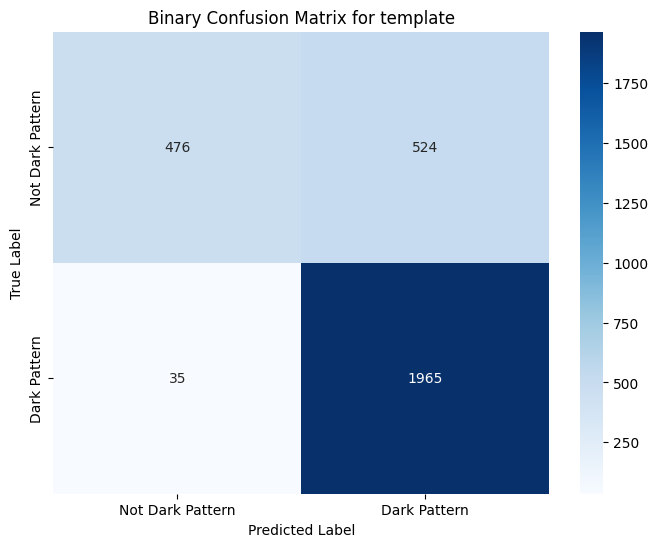

Confusion Matrix가 /content/drive/MyDrive/졸업논문/Test_Result/GNN/confusion_matrix_template_binary.png에 저장됨

[단계 7/7] template GNN 그래프 시각화 중 (이진 분류)...


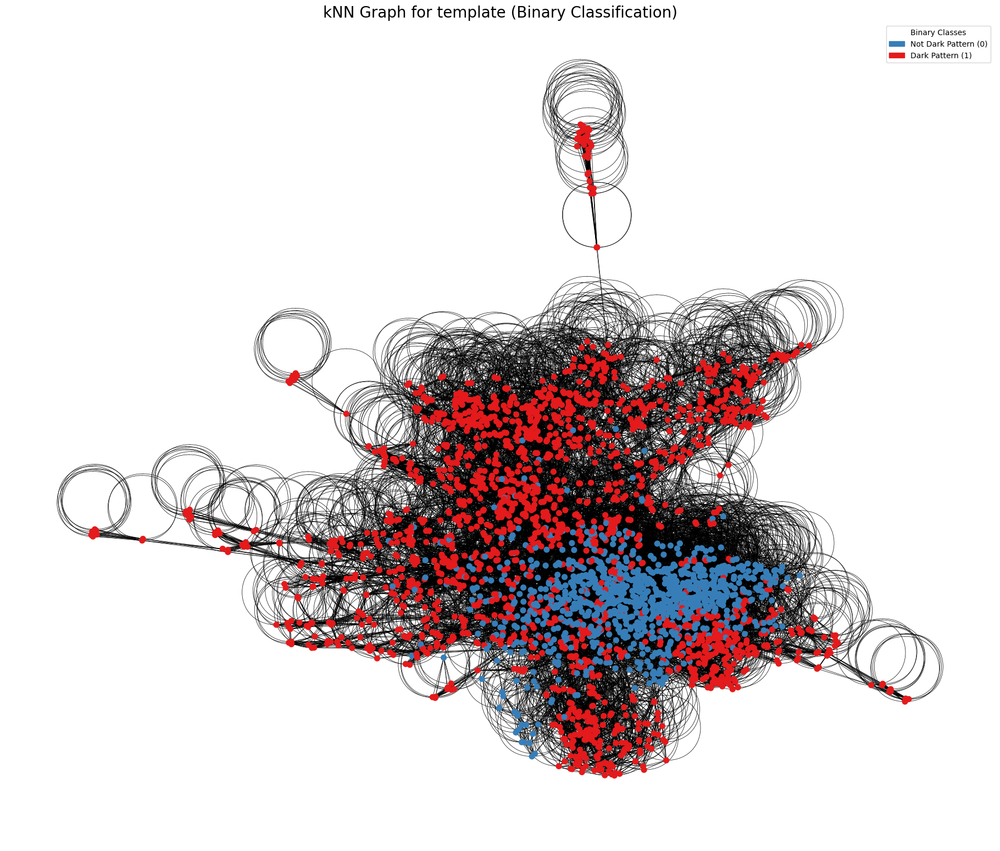

GNN 그래프가 /content/drive/MyDrive/졸업논문/Test_Result/GNN/gnn_graph_template_binary.png에 저장됨


모든 데이터셋에 대한 이진 분류 작업이 완료되었습니다.


In [6]:
# =========================================================================
# 이진 분류(Binary Classification)를 위한 새로운 GNN 분석 코드
# 'Not Dark Pattern' vs 'Dark Pattern'
# =========================================================================

import pandas as pd
from sklearn.preprocessing import LabelEncoder
from transformers import AutoTokenizer, AutoModel
from tqdm.notebook import tqdm
import numpy as np
from sklearn.neighbors import NearestNeighbors
import scipy.sparse as sp
from torch_geometric.data import Data
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
import torch.optim as optim
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from torch_geometric.utils import to_networkx
from matplotlib.patches import Patch
import os

# 기존 설정 변수를 그대로 사용합니다.
# SAVE_DIR, EMBED_MODEL, K_NEIGHBORS, HIDDEN_DIM, GNN_LAYERS, EPOCHS, LR, BATCH_SIZE, DEVICE

def run_gnn_binary_classification(df, dataset_name):
    """
    데이터프레임에 대해 이진 분류 GNN 모델을 실행하는 함수.
    'Not Dark Pattern'은 0, 나머지는 1로 처리합니다.
    """
    print("="*70)
    print(f"[{dataset_name}] 데이터셋에 대한 GNN 이진 분류 모델링 시작")
    print("="*70)

    # --- [단계 1] 이진 라벨 생성 ---
    print("\n[단계 1/7] 이진 라벨 생성 중...")
    sentence_col = 'String'
    type_col = 'Type' # 'Type' 컬럼을 기준으로 이진 분류
    df.dropna(subset=[sentence_col, type_col], inplace=True)

    # 'Not Dark Pattern'은 0, 그 외 모든 다크패턴은 1로 매핑
    df['binary_label'] = df[type_col].apply(lambda x: 0 if x == 'Not Dark Pattern' else 1)

    sentences = df[sentence_col].astype(str).tolist()
    labels_enc = df['binary_label'].values

    num_classes = 2 # 이진 분류이므로 클래스 개수는 2
    class_names = ['Not Dark Pattern', 'Dark Pattern']
    print(f"총 {num_classes}개의 클래스로 변환 완료: {class_names}")

    # --- [단계 2] 문장 임베딩 생성 (기존과 동일) ---
    print(f"\n[단계 2/7] '{EMBED_MODEL}' 모델로 문장 임베딩 생성 중...")
    embed_tokenizer = AutoTokenizer.from_pretrained(EMBED_MODEL)
    embed_model = AutoModel.from_pretrained(EMBED_MODEL).to(DEVICE)
    embed_model.eval()

    def mean_pooling(model_output, attention_mask):
        token_embeddings = model_output[0]
        input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
        return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

    all_embeddings = []
    for i in tqdm(range(0, len(sentences), BATCH_SIZE), desc=f"{dataset_name}_binary 임베딩"):
        batch_texts = sentences[i:i+BATCH_SIZE]
        inputs = embed_tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt").to(DEVICE)
        with torch.no_grad():
            outputs = embed_model(**inputs)
            emb = mean_pooling(outputs, inputs['attention_mask']).cpu().numpy()
        all_embeddings.append(emb)
    all_embeddings = np.vstack(all_embeddings)
    emb_path = os.path.join(SAVE_DIR, f"embeddings_{dataset_name}_binary.npy")
    np.save(emb_path, all_embeddings)
    print(f"임베딩 생성 완료 (형태: {all_embeddings.shape}), {emb_path}에 저장됨")

    # --- [단계 3 & 4] kNN 그래프 및 PyG 데이터 객체 생성 (기존과 동일) ---
    print("\n[단계 3/7] kNN 그래프 생성 중...")
    n_neighbors = min(K_NEIGHBORS, len(all_embeddings)-1)
    nbrs = NearestNeighbors(n_neighbors=n_neighbors+1, metric="cosine").fit(all_embeddings)
    _, indices = nbrs.kneighbors(all_embeddings)
    edge_index = nbrs.kneighbors_graph(all_embeddings, mode='connectivity').toarray()
    edge_index = sp.coo_matrix(edge_index)
    edge_index = torch.tensor(np.vstack((edge_index.row, edge_index.col)), dtype=torch.long)
    print(f"엣지 인덱스 생성 완료 (형태: {edge_index.shape})")

    print("\n[단계 4/7] PyTorch Geometric 데이터 객체 생성 중...")
    data = Data(x=torch.tensor(all_embeddings, dtype=torch.float),
                edge_index=edge_index,
                y=torch.tensor(labels_enc, dtype=torch.long))
    num_nodes = data.num_nodes
    perm = np.random.permutation(num_nodes)
    train_idx, val_idx = perm[:int(0.8*num_nodes)], perm[int(0.8*num_nodes):]
    data.train_mask = torch.zeros(num_nodes, dtype=torch.bool)
    data.val_mask = torch.zeros(num_nodes, dtype=torch.bool)
    data.train_mask[train_idx] = True
    data.val_mask[val_idx] = True
    print("데이터 객체 생성 완료:", data)

    # --- [단계 5] GNN 모델 학습 ---
    print("\n[단계 5/7] GNN 모델 학습 중...")
    class GCNClassifier(torch.nn.Module):
        def __init__(self, in_dim, hidden_dim, out_dim, n_layers=2, dropout=0.5):
            super().__init__()
            self.convs = torch.nn.ModuleList()
            self.convs.append(GCNConv(in_dim, hidden_dim))
            for _ in range(n_layers-1):
                self.convs.append(GCNConv(hidden_dim, hidden_dim))
            self.lin = torch.nn.Linear(hidden_dim, out_dim)
            self.dropout = dropout
        def forward(self, x, edge_index):
            for conv in self.convs:
                x = conv(x, edge_index)
                x = F.relu(x)
                x = F.dropout(x, p=self.dropout, training=self.training)
            return self.lin(x)

    # out_dim을 num_classes(즉, 2)로 설정
    model_gnn = GCNClassifier(in_dim=data.x.size(1), hidden_dim=HIDDEN_DIM, out_dim=num_classes, n_layers=GNN_LAYERS).to(DEVICE)
    optimizer = optim.Adam(model_gnn.parameters(), lr=LR, weight_decay=1e-5)
    criterion = torch.nn.CrossEntropyLoss()
    data = data.to(DEVICE)

    for epoch in range(1, EPOCHS + 1):
        model_gnn.train()
        optimizer.zero_grad()
        out = model_gnn(data.x, data.edge_index)
        loss = criterion(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()
        if epoch % 2 == 0 or epoch == EPOCHS:
            print(f"Epoch {epoch:02d}, Loss: {loss.item():.4f}")

    model_path = os.path.join(SAVE_DIR, f"gnn_model_{dataset_name}_binary.pt")
    torch.save(model_gnn.state_dict(), model_path)
    print(f"학습 완료, 모델이 {model_path}에 저장됨")

    # --- [단계 6] 예측 및 성능 평가 ---
    print("\n[단계 6/7] 예측 및 성능 평가 리포트 생성 중...")
    model_gnn.eval()
    with torch.no_grad():
        out = model_gnn(data.x, data.edge_index)
    preds = out.argmax(dim=1).cpu().numpy()

    report = classification_report(labels_enc, preds, target_names=class_names, zero_division=0)
    print("\n--- 최종 성능 평가 리포트 ---")
    print(report)

    cm = confusion_matrix(labels_enc, preds)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Binary Confusion Matrix for {dataset_name}')
    cm_path = os.path.join(SAVE_DIR, f"confusion_matrix_{dataset_name}_binary.png")
    plt.savefig(cm_path)
    plt.show()
    print(f"Confusion Matrix가 {cm_path}에 저장됨")


    # --- [단계 7/7] GNN 그래프 시각화  ---
    print(f"\n[단계 7/7] {dataset_name} GNN 그래프 시각화 중 (이진 분류)...")
    G = to_networkx(data.cpu(), to_undirected=True)

    # ! 색상 대비를 위해 컬러맵 대신 직접 색상 리스트 지정 (파란색, 빨간색)
    color_list = ['#377eb8', '#e41a1c']
    node_colors = [color_list[i] for i in data.y.cpu().numpy()]

    plt.figure(figsize=(18, 15))
    pos = nx.spring_layout(G, iterations=50, seed=42)
    nx.draw(G, pos, node_color=node_colors, with_labels=False, node_size=50, width=0.5)

    # ! 범례에도 직접 지정한 색상 적용
    legend_handles = [Patch(color=color_list[0], label='Not Dark Pattern (0)'),
                      Patch(color=color_list[1], label='Dark Pattern (1)')]

    plt.legend(handles=legend_handles, title="Binary Classes", loc='upper right')
    plt.title(f'kNN Graph for {dataset_name} (Binary Classification)', fontsize=20)
    graph_path = os.path.join(SAVE_DIR, f"gnn_graph_{dataset_name}_binary.png")
    plt.savefig(graph_path, bbox_inches='tight')
    plt.show()
    print(f"GNN 그래프가 {graph_path}에 저장됨")


# =========================================================================
# 각 데이터셋에 대해 이진 분류 함수 실행
# =========================================================================
data_files = {
    "contextual": '/content/drive/MyDrive/졸업논문/data/processed/contextual_merged.csv',
    "paraphrase": '/content/drive/MyDrive/졸업논문/data/processed/paraphrase_merged.csv',
    "template": '/content/drive/MyDrive/졸업논문/data/processed/template_merged.csv'
}

for name, path in data_files.items():
    print(f"\n\n{'='*30} '{name}' 데이터셋 처리 시작 {'='*30}")
    try:
        df = pd.read_csv(path)
        # 컬럼 이름 통일 (기존 로직과 동일)
        if 'text' in df.columns and 'String' not in df.columns:
            df.rename(columns={'text': 'String'}, inplace=True)

        # 이진 분류 함수 호출
        run_gnn_binary_classification(df, name)

    except FileNotFoundError:
        print(f"[오류] {path} 파일을 찾을 수 없습니다. 건너뜁니다.")
    except Exception as e:
        print(f"[오류] {name} 데이터셋 처리 중 오류 발생: {e}")

print("\n\n모든 데이터셋에 대한 이진 분류 작업이 완료되었습니다.")